In [1]:
%run common-imports.ipynb

# Auto Dataset

This is a classic dataset comprising of the characteristics of a car, and how these affects the mileage. It requires us to build various regression models, and their their performance.

The exact problem statement is shown below. However, we will address the problem using Python's sklearn toolkit.

<img src="islr-auto-problem-smaller.png"/>


In [2]:
data = pd.read_csv("../datasets/Auto.csv")

In [3]:
data.sample(5)

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
114,26.0,4,98.0,90,2265,15.5,73,2,fiat 124 sport coupe
278,31.5,4,89.0,71,1990,14.9,78,2,volkswagen scirocco
237,30.5,4,98.0,63,2051,17.0,77,1,chevrolet chevette
57,24.0,4,113.0,95,2278,15.5,72,3,toyota corona hardtop
72,15.0,8,304.0,150,3892,12.5,72,1,amc matador (sw)


#### Descriptive statistics


In [4]:
data.describe(include="all").transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
mpg,397.0,NaN,NaN,NaN,23.515869,7.825804,9.0,17.5,23.0,29.0,46.6
cylinders,397.0,NaN,NaN,NaN,5.458438,1.701577,3.0,4.0,4.0,8.0,8.0
displacement,397.0,NaN,NaN,NaN,193.532746,104.379583,68.0,104.0,146.0,262.0,455.0
horsepower,397,94,150,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weight,397.0,NaN,NaN,NaN,2970.261965,847.904119,1613.0,2223.0,2800.0,3609.0,5140.0
acceleration,397.0,NaN,NaN,NaN,15.555668,2.749995,8.0,13.8,15.5,17.1,24.8
year,397.0,NaN,NaN,NaN,75.994962,3.690005,70.0,73.0,76.0,79.0,82.0
origin,397.0,NaN,NaN,NaN,1.574307,0.802549,1.0,1.0,1.0,2.0,3.0
name,397,304,ford pinto,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN


from observation of the table leads us to infer:
* origin is likely a categorical variable; documentation of this dataset confirms this belief: it stands for the country of origin of the car
* horsepower is marked as a categorical variable. This implies there must have been values that are non-numeric. Below, let us find those and elide them from the data.
* name is indeed a categorical variable; it is unlikely to be of significant value in building a predictive model, so we will drop it going forward.

In [5]:
unique_values = data.horsepower.unique()
[ x for x in unique_values if x.isnumeric() == False]

['?']

the `horsepower` is being read as a categorical variable because some of the values are '?'. Let us drop those record, and covert the variable to a numeric type. Also, let's convert `origin` to categorical.

In [6]:
data = data[data.horsepower !='?'].astype({'horsepower':'float', 'origin':'string'})


drop the `name` variable from the dataset.

In [7]:
data.drop('name', axis=1, inplace=True)

In [8]:
data.isnull().sum()

mpg             0
cylinders       0
displacement    0
horsepower      0
weight          0
acceleration    0
year            0
origin          0
dtype: int64

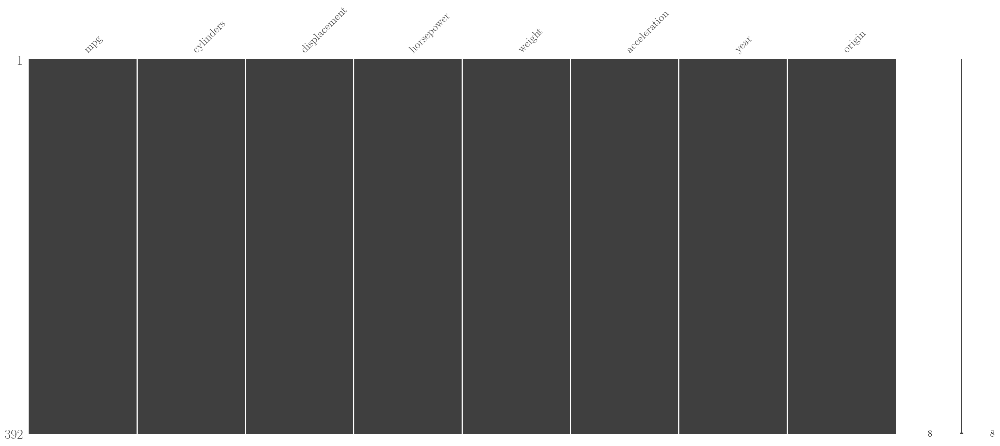

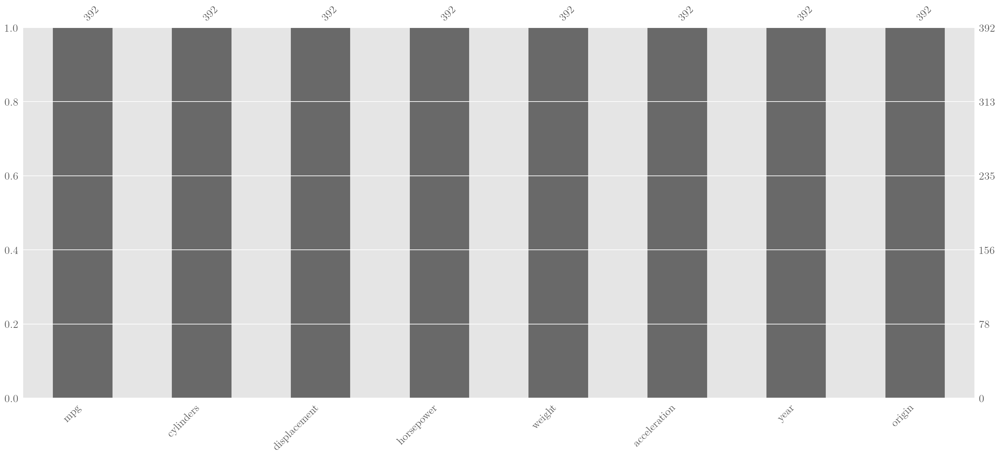

In [9]:
import missingno as msno
msno.matrix(data);
plt.show()
msno.bar(data);
plt.show()

 From the above results, it appears that there are no missing values at all. Therefore, we don't need to worry about addressing this issue.

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 392 entries, 0 to 396
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   mpg           392 non-null    float64
 1   cylinders     392 non-null    int64  
 2   displacement  392 non-null    float64
 3   horsepower    392 non-null    float64
 4   weight        392 non-null    int64  
 5   acceleration  392 non-null    float64
 6   year          392 non-null    int64  
 7   origin        392 non-null    string 
dtypes: float64(4), int64(3), string(1)
memory usage: 27.6 KB


#### Pandas Profiling

In [11]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Visualization

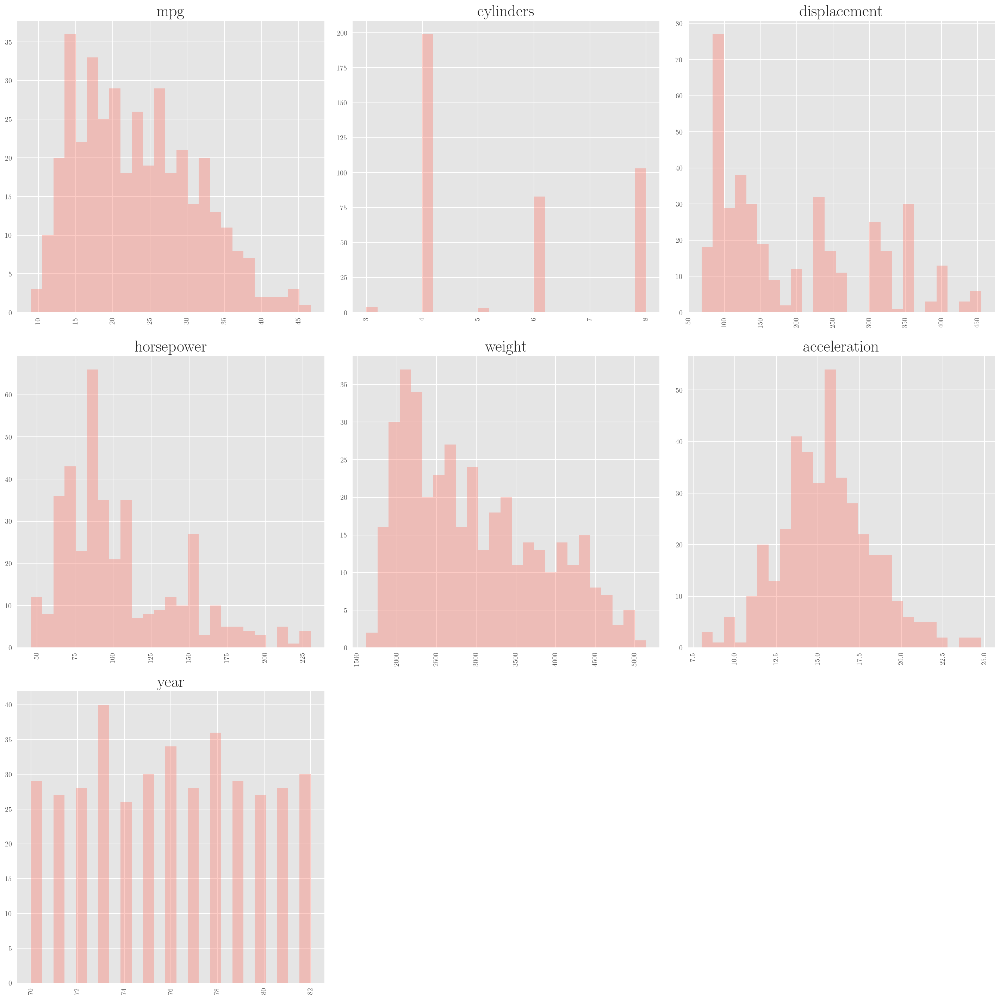

In [12]:
data.hist( bins=25, alpha = 0.4, color='salmon', xrot=90, figsize=(20,20));
plt.tight_layout()

Let us see how the data is distributed with respect to the origin.

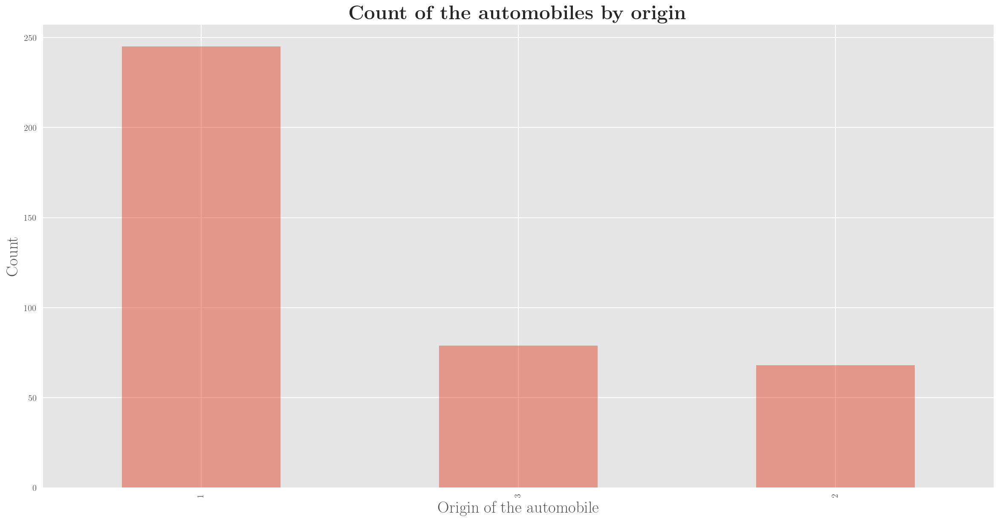

In [13]:
data['origin'].value_counts().plot(kind='bar', alpha=0.5);
plt.xlabel('Origin of the automobile')
plt.ylabel('Count')
plt.title(r'\textbf {Count of the automobiles by origin}');

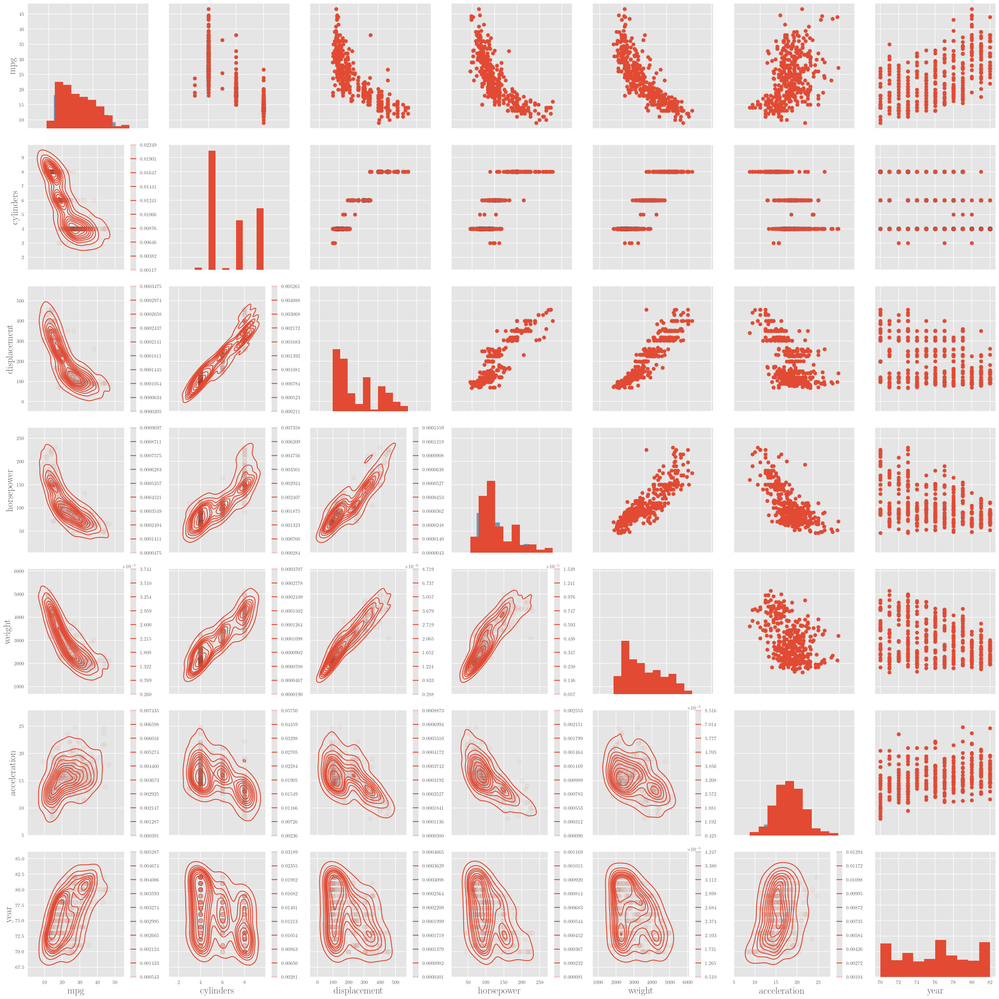

In [14]:
sample = data
fig = sns.pairplot(sample, 
                   plot_kws = {'alpha': 0.05, 's': 80, 'edgecolor': 'k'}, 
                   size=4, );
fig.map_diag(plt.hist);
fig.map_upper(plt.scatter);
fig.map_lower(sns.kdeplot, shade=False, shade_lowest=False, cbar=True);
plt.tight_layout()

### Violin plot & Box plot of features by car origin

The violin plot and box plot will help us see the data distribution by each feature. We have separated the data by the origin of the car.

From the box-plot, it is clear that there is a presence of modest outliers in the data ( though there are no extreme outliers). This implies that we could continue with the `StandardScaler` for scaling the data, and need not use, say, `QuantileScaler`.

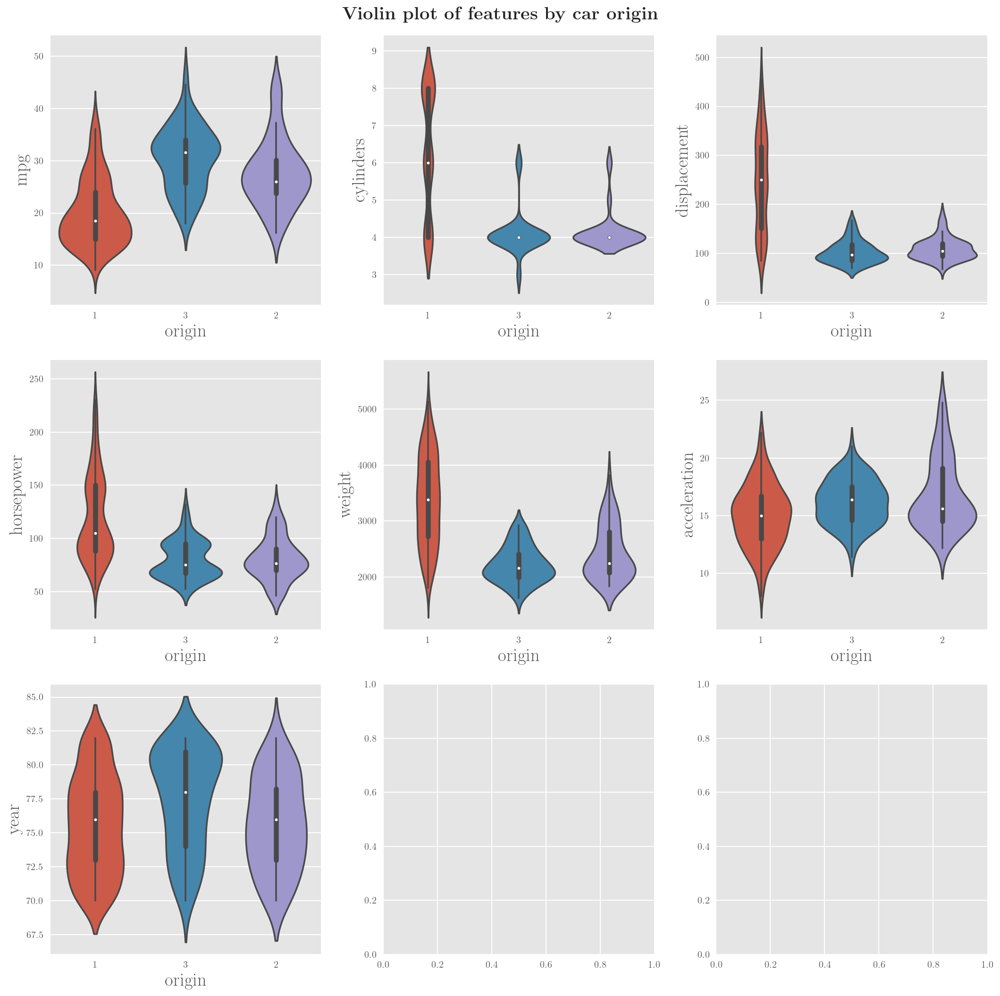

In [15]:

features = data.columns.tolist()
features.remove('origin') # it is a categorical

# Because there are 7 numerical features
fig, axes = plt.subplots(3,3, sharey=False, figsize=(15,15))
for i in range(len(features)):
    sns.violinplot(  x    = 'origin', 
                     y    = features[i], 
                     data = data,ax=axes[int(i/3), i%3], figsize=(5,5));
fig.suptitle(r'\textbf{Violin plot of features by car origin}');
plt.tight_layout()

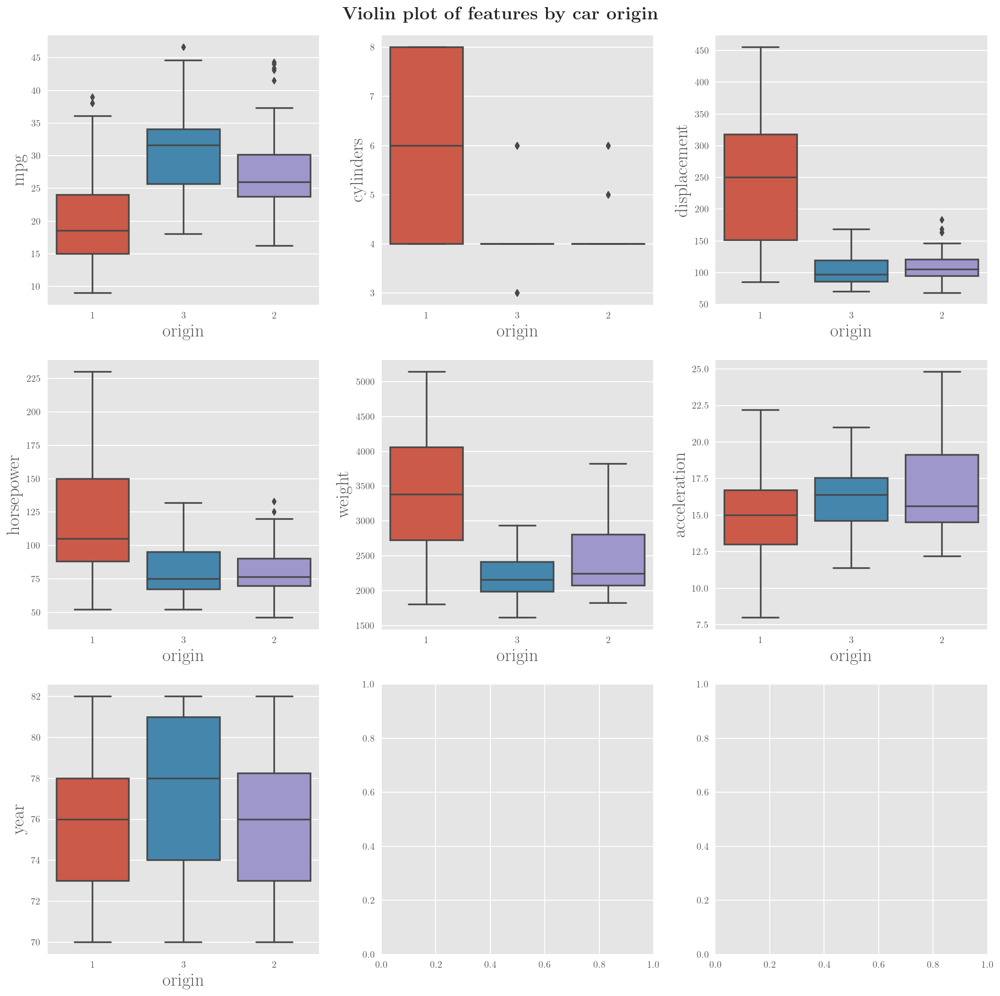

In [16]:
features = data.columns.tolist()
features.remove('origin') # it is a categorical

# Because there are 7 numerical features
fig, axes = plt.subplots(3,3, sharey=False, figsize=(15,15))
for i in range(len(features)):
    sns.boxplot(  x    = 'origin', 
                     y    = features[i], 
                     data = data,ax=axes[int(i/3), i%3]);
fig.suptitle(r'\textbf{Violin plot of features by car origin}');
plt.tight_layout()

## Correlation

Let us now study the correlation between features. It is generally good to observe strong correlation between the target variable (here, `mpg`) and the predictions. However, linear regression is adversely affected if there is a strong correlation among the predictors, i.e. multicollinearity.

In [17]:
corr = data.corr()
corr

,mpg,cylinders,displacement,horsepower,weight,acceleration,year
mpg,1.000000,-0.777618,-0.805127,-0.778427,-0.832244,0.423329,0.580541
cylinders,-0.777618,1.000000,0.950823,0.842983,0.897527,-0.504683,-0.345647
displacement,-0.805127,0.950823,1.000000,0.897257,0.932994,-0.543800,-0.369855
horsepower,-0.778427,0.842983,0.897257,1.000000,0.864538,-0.689196,-0.416361
weight,-0.832244,0.897527,0.932994,0.864538,1.000000,-0.416839,-0.309120
acceleration,0.423329,-0.504683,-0.543800,-0.689196,-0.416839,1.000000,0.290316
year,0.580541,-0.345647,-0.369855,-0.416361,-0.309120,0.290316,1.000000


From the data above, and the figure below, it is evident that we have a strong correlation between three predictors:
`weight`, `cylinders` and `displacement`.

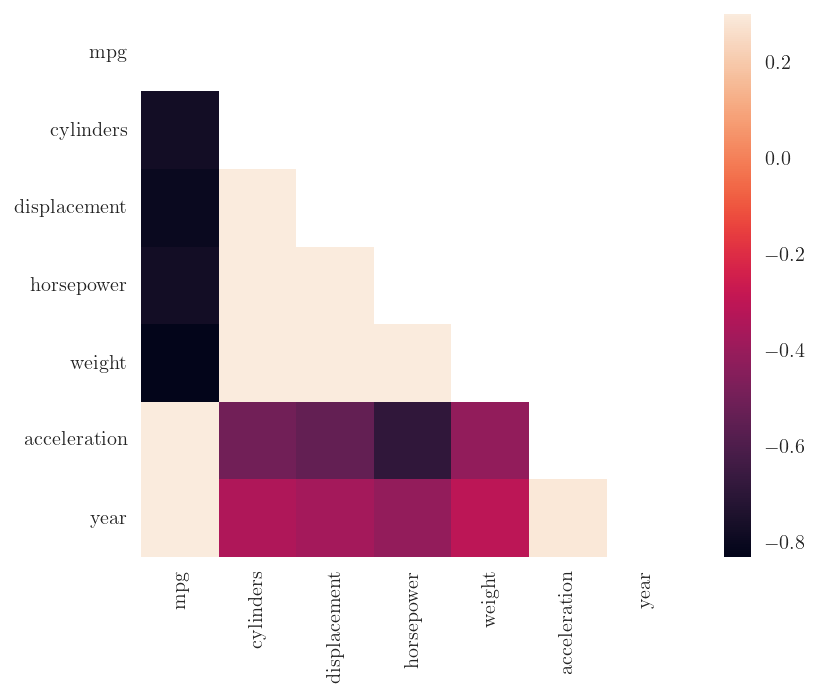

In [18]:
import numpy as np
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(7, 5))
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

As usual, we will first separate out the predictor from the target, and then split the data into a training and test set.

In [19]:
X, y = data[['horsepower']], data['mpg']

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42,train_size=0.75)

# Univariate Regresion: mpg vs horsepower

build a univariate regression model of `mpg` vs `horsepower`.

## Visualize the univariate regression data

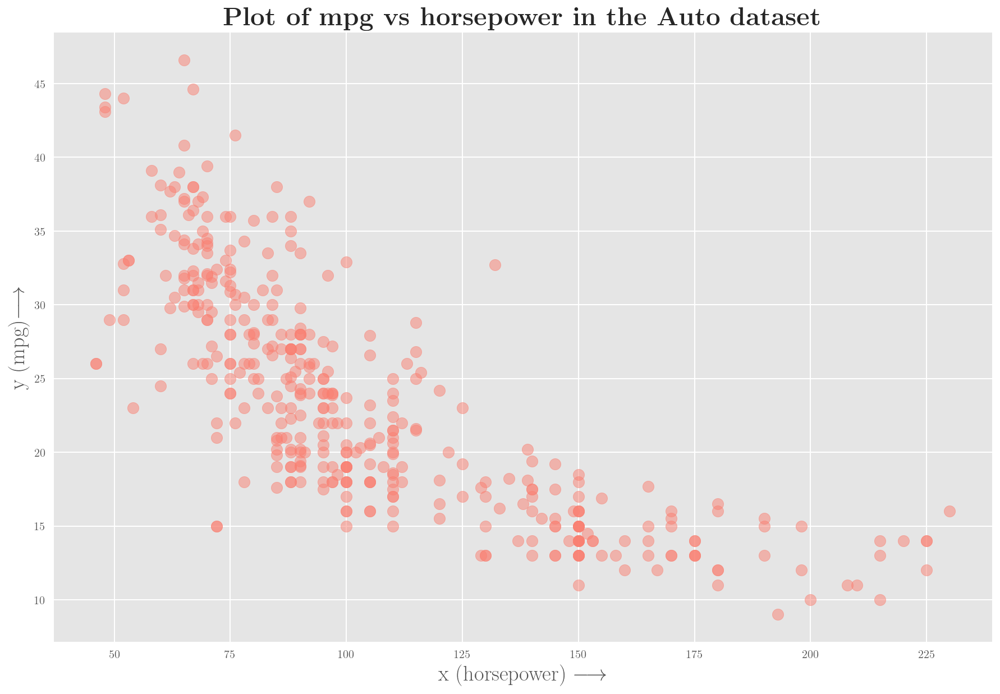

In [21]:
plt.figure(figsize=(15,10))
plt.scatter(X.horsepower, y, alpha=0.5, s=100, color='salmon')
plt.xlabel(r'x (horsepower) $\longrightarrow$');
plt.ylabel(r'y (mpg)$\longrightarrow$');
plt.title(r'\textbf{Plot of mpg vs horsepower in the Auto dataset}');

In the above plot, we can clearly see a nonlinearity of the relationship. Indeed, it looks like a reciprocal relationship:
$$\begin{equation}
y \propto \frac{1}{x^n}
\end{equation}$$

A simple way to linearize the relationship would be to take the log of the variables:

$$\begin{equation}
\log(y) \propto -n \log(x)
\end{equation}$$

Let us see if this guess works, by visualizing the log-transformed variables:

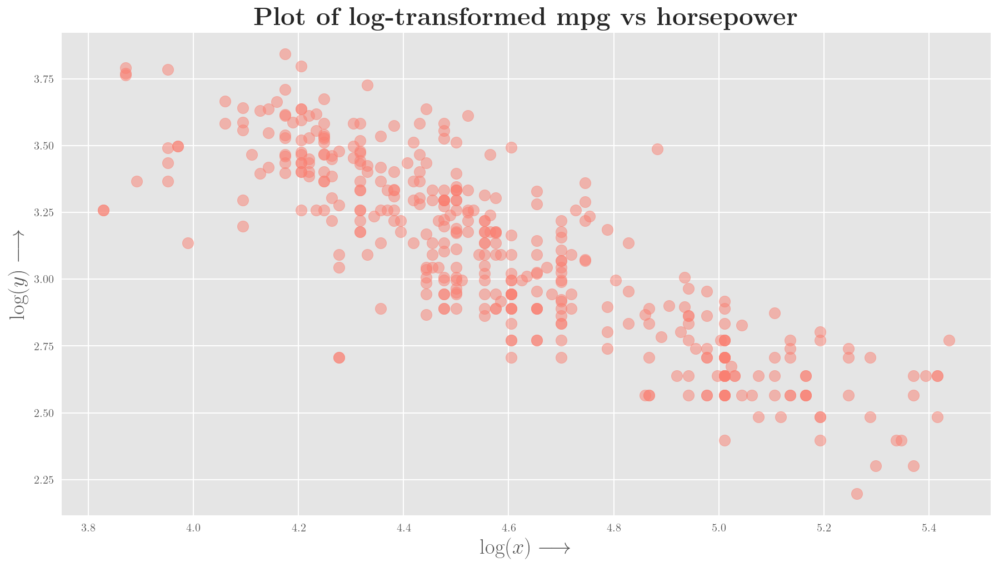

In [22]:


plt.figure(figsize=(15,8))
plt.scatter(np.log(X.horsepower), np.log(y), alpha=0.5, s=100, color='salmon')
plt.xlabel(r'$\log (x)\longrightarrow$');
plt.ylabel(r'$\log (y) \longrightarrow$');
plt.title(r'\textbf{Plot of log-transformed mpg vs horsepower}');

This certainly does look more linear!

## Regression in the original variables

Here we build a simple model without any variable transformation:

In [23]:
model = LinearRegression();
model.fit(X_train, y_train);

Recall that a linear regression model is given by the equation:

\begin{equation} y =  \beta_0 + \beta_1 x + \epsilon\end{equation}

where:
$\epsilon$ is the irreducible error term, so that the model is essentially:

\begin{equation} \hat{y} =  \beta_0 + \beta_1 x \end{equation}

What values of $\beta_0$ (the intercept) and $\beta_1$ (the slope) is this model predicting? We can inspect this as follows:

In [24]:
print (f'Intercept: {model.intercept_}, Slope: {model.coef_}')

Intercept: 40.67041203983449, Slope: [-0.16251347]


Look back at the data visualization, and see if this agrees with your own estimates.

### Predictions from the model

Now, let us use the model to make predictions on the **test** data, something the model has not seen so far. By comparing the predictions to the actual values, we will get a sense of how well the model has learned to generalize from the data. 


In [25]:
yhat = model.predict(X_test)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, yhat))
r2 = r2_score(y_test, yhat)
print(rf"Coefficient of Determination (R^2):{r2}")

Mean Squared Error: 21.91
Coefficient of Determination (R^2):0.5655794324593799


The coefficient of determination, $R^2$ indicates a dismal model! Should we plod on to the next step of model verification: namely the residual analysis.

### Residual Analysis

We will start by plotting the residuals from the predictions. Recall that the residual from the prediction $\hat{y}_i$ on a particular datum $(x_i, y_i)$ is defined as: 

\begin{equation}\mathbf{ r_i = \hat{y}_i  - y_i }\end{equation}

We will use the `yellowbrick` library for looking at the model characteristics.

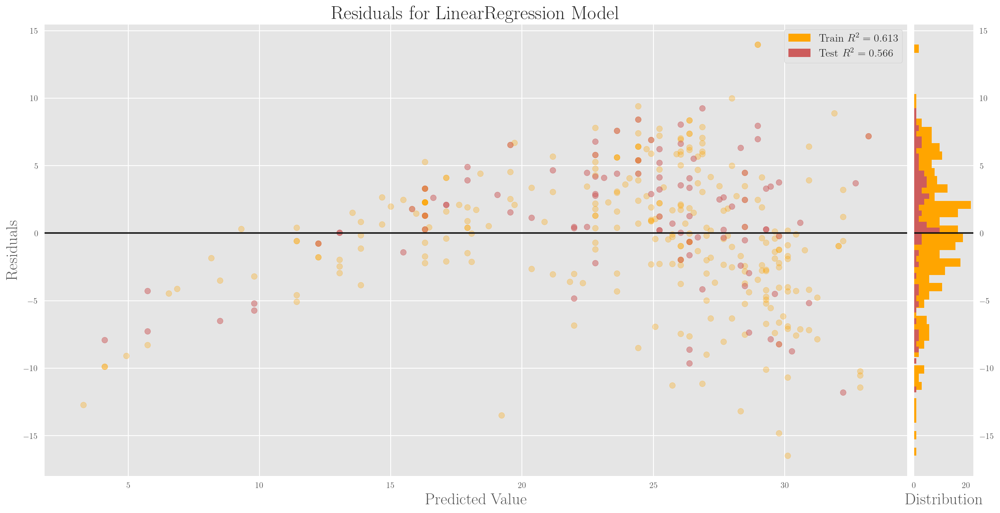

In [26]:
from yellowbrick.regressor import residuals_plot
viz = residuals_plot(model, X_train, y_train, X_test, y_test, 
                     train_color='orange', test_color='IndianRed', train_alpha=0.3, test_alpha=0.5)

The residuals display a striking pattern! The presence of a pattern in the residuals and noticeable heteroscedasticity are a clear indication that the model has failed to capture some essential characteristics of the relationship between $x$ and $y$. In the prediction errors plot below, we observe that the agreement between prediction and ground truth leaves quite some scope for improvement.

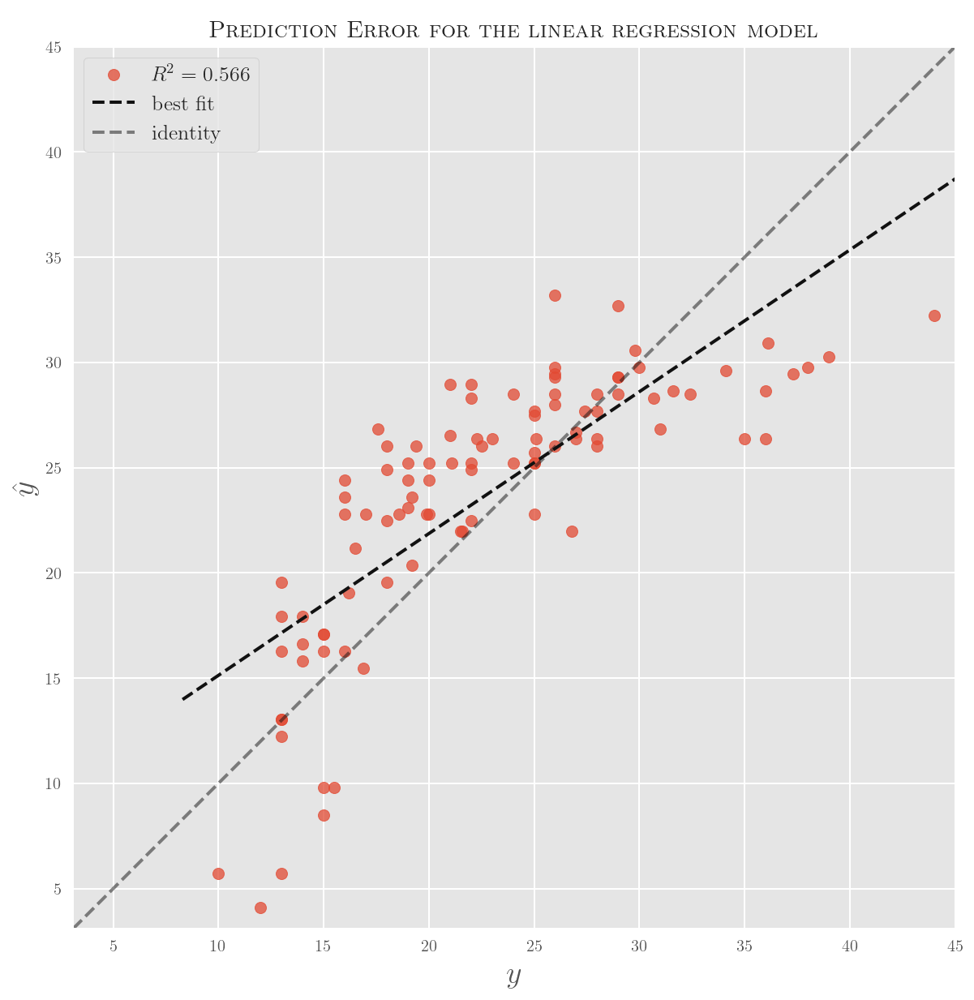

In [27]:
from yellowbrick.regressor import prediction_error

visualizer = prediction_error(model, X_train, y_train, X_test, y_test,
                             title=r'\textsc{\Large Prediction Error for the linear regression model}',
                             xlabel=r'$\mathbf{y}$', ylabel=r'$\mathbf{\hat{y}}$')

### Visualization of the model predictions

As a final step, let us visualize the predictions of the model, and superimpose it on the actual data. This should give us a sense of how well the model is working.

In [28]:
 
XX = pd.DataFrame(data={'x': np.linspace(data.horsepower.min(), data.horsepower.max(), 1000)}) 
yhat = model.predict(XX)

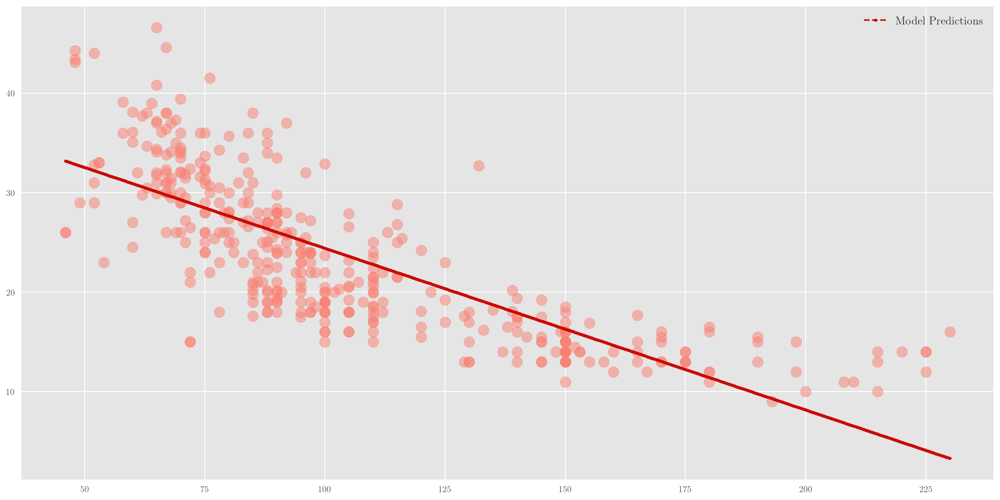

In [29]:
fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(data['horsepower'], data['mpg'], alpha=0.5, s=150, color='salmon')
ax.plot(XX.x, yhat, 'r--.', label="Model Predictions")
ax.legend(loc='best');

This simple linear model in the original variables does not seem to have done well:

* we have an $R^2$ of about 50%
* the residuals plot clearly shows a pattern,and heteroscedasticity
* the predictions plot overlayed on the data shows that it is not a high fidelity model

## Log-transformeed Model

Now, let us repeat the analysis with log-transformed variables.

In [30]:
X_train_log = np.log(X_train)
y_train_log = np.log(y_train)
X_test_log = np.log (X_test)
y_test_log = np.log (y_test)

model = LinearRegression();
model.fit(X_train_log, y_train_log);

print (f'Intercept: {model.intercept_}, Slope: {model.coef_}')

Intercept: 7.019606111062634, Slope: [-0.85304831]


### Predictions from the model

In [31]:
yhat = model.predict(X_test_log)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, yhat))
r2 = r2_score(y_test_log, yhat)
print(rf"Coefficient of Determination (R^2):{r2}")

Mean Squared Error: 431.51
Coefficient of Determination (R^2):0.7186509511881423


The coefficient of determination seems to be better than the previous model. Let's proceed to the residual analysis.

### Residual Analysis

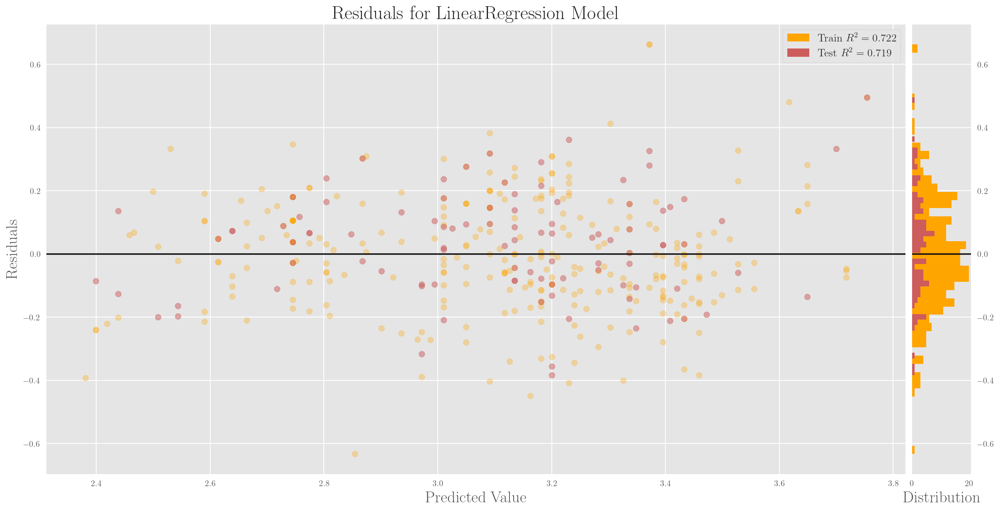

In [32]:
from yellowbrick.regressor import residuals_plot
viz = residuals_plot(model, X_train_log, y_train_log, X_test_log, y_test_log, 
                     train_color='orange', test_color='IndianRed', train_alpha=0.3, test_alpha=0.5)

We notice that the residuals plot shows considerable improvement: we don't see a pronounced pattern. Also, from the prediction error plot below, we see that the agreement between prediction and the actual target value has improved quite a bit.

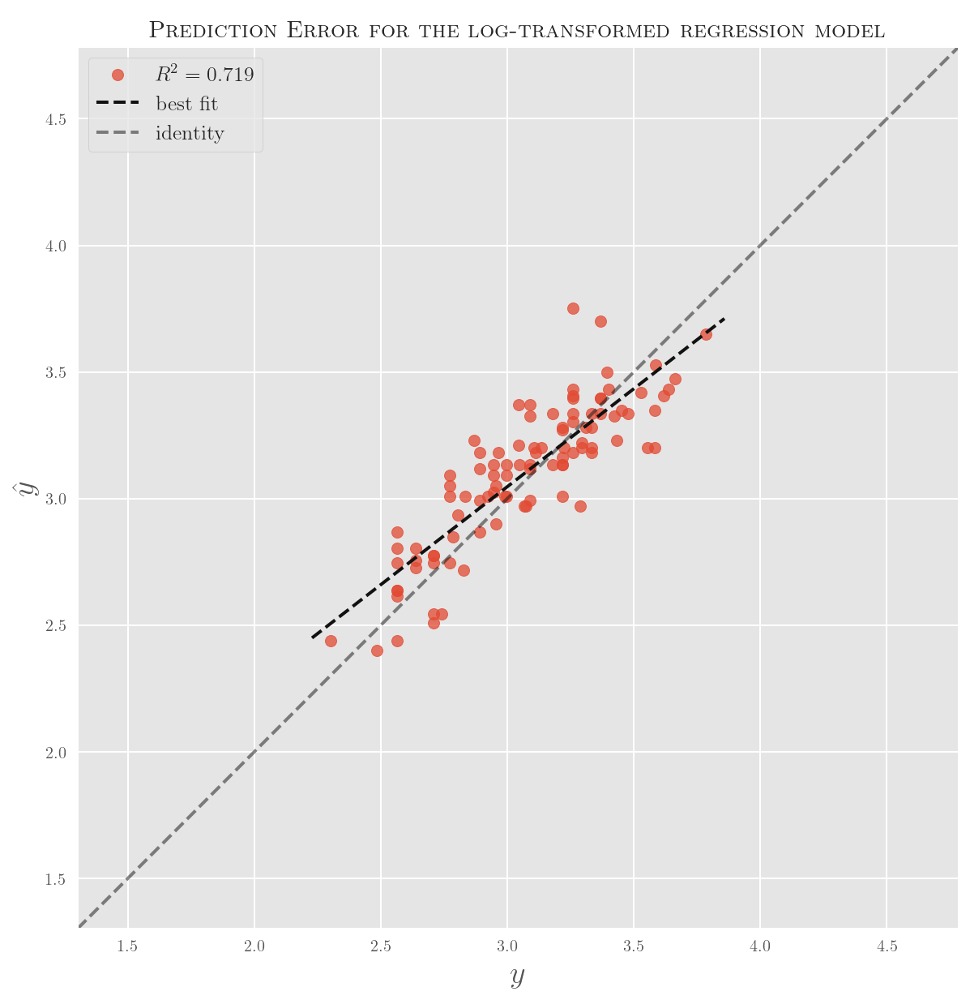

In [33]:
from yellowbrick.regressor import prediction_error

visualizer = prediction_error(model, X_train_log, y_train_log, X_test_log, y_test_log,
                             title=r'\textsc{\Large Prediction Error for the log-transformed regression model}',
                             xlabel=r'$\mathbf{y}$', ylabel=r'$\mathbf{\hat{y}}$')

### Visualization of the model predictions

As a final step, let us visualize the predictions of the model, and superimpose it on the actual data. This should give us a sense of how well the model is working.

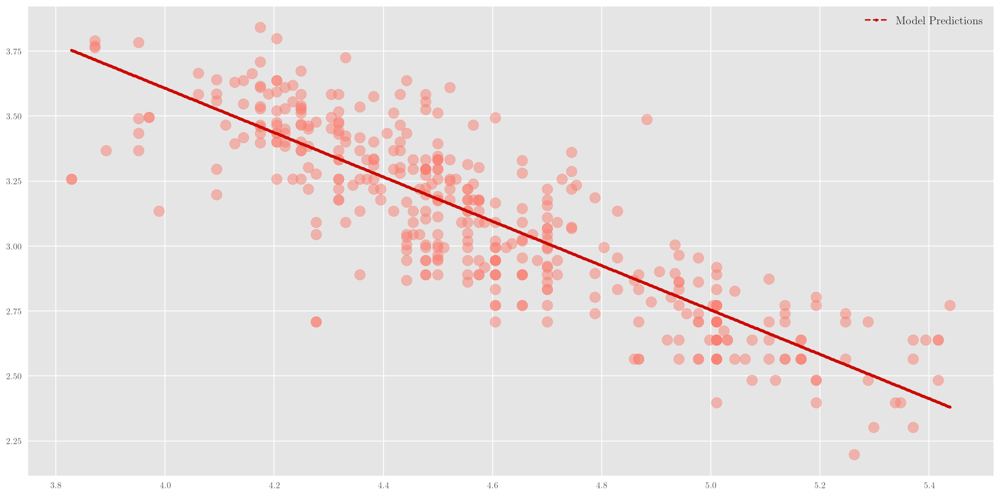

In [34]:
 
XX = pd.DataFrame(data={'x': np.linspace(np.log(data.horsepower.min()), np.log(data.horsepower.max()), 1000)}) 
yhat = model.predict(XX)

fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(np.log(data.horsepower), np.log(data.mpg), alpha=0.5, s=150, color='salmon')
ax.plot(XX.x, yhat, 'r--.', label="Model Predictions")
ax.legend(loc='best');

The model predictions agree  well with the data, all things considered. To summarize:

* the coefficient of determination of this model is better than the previous one
* the residuals plot does not have a pronounced pattern
* the model predictions when visualized over the data show general agreement


### Power Transformation

Perhaps the observant reader is curious -- why did we not try a power transformation instead? Let us give that a chance too; however, for brevity, we will skip some of the explanations.

In [35]:
model = make_pipeline(PowerTransformer(), LinearRegression())
model.fit(X_train, y_train)
yhat = model.predict(X_test)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, yhat))
r2 = r2_score(y_test, yhat)
print(rf"Coefficient of Determination (R^2):{r2}")

Mean Squared Error: 18.09
Coefficient of Determination (R^2):0.6412982886629983


Observe that a direct application of power transform is not as effective. There is an important lesson here: **bringing your own intuition and experience in feature extraction often beats routine application of standard techniques**.

As an exercise, do the residual analysis and plot the predictions, to see what happens.

### Polynomial Regression

Another possibility could have been to use polynomial regression. Lets give that a try, with a polynomial of say, degree three.

In [36]:
model = make_pipeline(PolynomialFeatures(degree=3), LinearRegression())
model.fit(X_train, y_train)
yhat = model.predict(X_test)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, yhat))
r2 = r2_score(y_test, yhat)
print(rf"Coefficient of Determination (R^2):{r2}")

Mean Squared Error: 17.19
Coefficient of Determination (R^2):0.6592186518719526


Clearly, while this has improved upon our very first model, it is not better than the log-tranformed model. It is an exercise for you to think and reason why this is so.

# Multivariate Regression

Let us build a multivariate ordinary least squares linear regression model for this dataset. In the process, let us:
* one-hot encode the `origin` feature
* **standardize** the features
* **power-transform** the features, since many of them have a pronounced right-skewed histograms


In [37]:
data  = pd.get_dummies(data, prefix_sep=':', columns=['origin'])
data.describe(include='all').transpose()


,count,mean,std,min,25%,50%,75%,max
mpg,392.0,23.445918,7.805007,9.0,17.000,22.75,29.000,46.6
cylinders,392.0,5.471939,1.705783,3.0,4.000,4.00,8.000,8.0
displacement,392.0,194.411990,104.644004,68.0,105.000,151.00,275.750,455.0
horsepower,392.0,104.469388,38.491160,46.0,75.000,93.50,126.000,230.0
weight,392.0,2977.584184,849.402560,1613.0,2225.250,2803.50,3614.750,5140.0
acceleration,392.0,15.541327,2.758864,8.0,13.775,15.50,17.025,24.8
year,392.0,75.979592,3.683737,70.0,73.000,76.00,79.000,82.0
origin:1,392.0,0.625000,0.484742,0.0,0.000,1.00,1.000,1.0
origin:2,392.0,0.173469,0.379136,0.0,0.000,0.00,0.000,1.0
origin:3,392.0,0.201531,0.401656,0.0,0.000,0.00,0.000,1.0


In [38]:
X, y = data.drop('mpg', axis=1), data['mpg']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42,train_size=0.5)

## Model 0: Dummy Regressor

We need a baseline model, or a null-hypothesis model. As we recall for the null-hypothesis model, it posits that there is no relationship between the target variable and any of the predictors. Thus, the best one can do is to always predict something sensible, such as a mean or median, etc. of the response values, whatever the input.

Here, since the data displays a right skew, let us consider the median as a sensible value to predict.


In [39]:
null= DummyRegressor(strategy='median')
null.fit(X_train, y_train)
ŷ = null.predict(X_test)
yhat = null.predict(X_test)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, ŷ))
r2 = r2_score(y_test, ŷ)
print(rf"Coefficient of Determination (R^2):{r2}")

Mean Squared Error: 56.22
Coefficient of Determination (R^2):-0.0013821354674496966


This is clearly not an effective model at all! However, it does give us a good baseline.

## Model 1: Linear Regression without data transformations

In [40]:
model = LinearRegression()
model.fit(X_train, y_train)
ŷ = model.predict(X_test)
yhat = model.predict(X_test)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, ŷ))
r2 = r2_score(y_test, ŷ)
print(rf"Coefficient of Determination (R^2):{r2}")

Mean Squared Error: 11.22
Coefficient of Determination (R^2):0.8001075924534398


This does seem to be huge improvement over the baseline dummy regressor. Let us see if this holds up on residual analysis:

### Residual Analysis

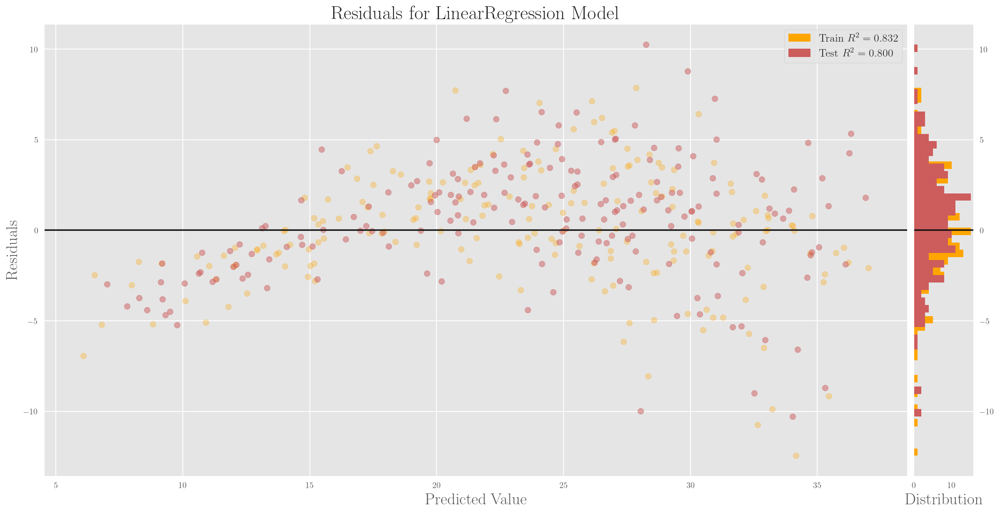

In [41]:
from yellowbrick.regressor import residuals_plot
viz = residuals_plot(model, X_train, y_train, X_test, y_test, 
                     train_color='orange', test_color='IndianRed', train_alpha=0.3, test_alpha=0.5)

We observe a distinct pattern, and heteroscedasticity of the residuals.So this may not be the most effective model for the data. It also suggests we need some transformations to be applied to the data. The prediction error plot below shows a much smaller divergence between the predictions and actual target values, compared to the univariate regression models.

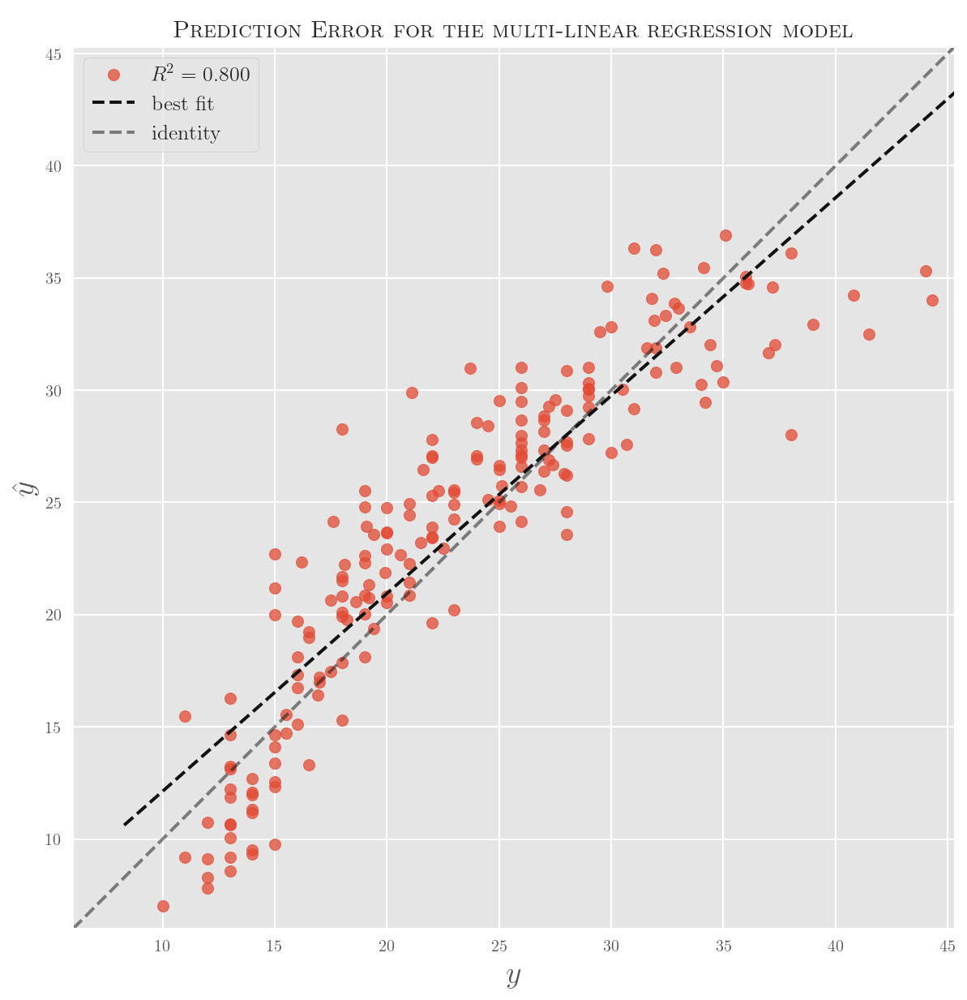

In [42]:
from yellowbrick.regressor import prediction_error

visualizer = prediction_error(model, X_train, y_train, X_test, y_test,
                             title=r'\textsc{\Large Prediction Error for the multi-linear regression model}',
                             xlabel=r'$\mathbf{y}$', ylabel=r'$\mathbf{\hat{y}}$')

## Model 2: With scaling & power-transformation

In [43]:
model = make_pipeline(StandardScaler(), PowerTransformer(), LinearRegression())
model.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('powertransformer', PowerTransformer()),
                ('linearregression', LinearRegression())])

### Predictions from the model

Now, let us use the model to make predictions on the **test** data, something the model has not seen so far. By comparing the predictions to the actual values, we will get a sense of how well the model has learned to generalize from the data. 


In [44]:
yhat = model.predict(X_test)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, yhat))
r2 = r2_score(y_test, yhat)
print(rf"Coefficient of Determination (R^2):{r2}")

Mean Squared Error: 10.30
Coefficient of Determination (R^2):0.8164977206170151


### Residual Analysis

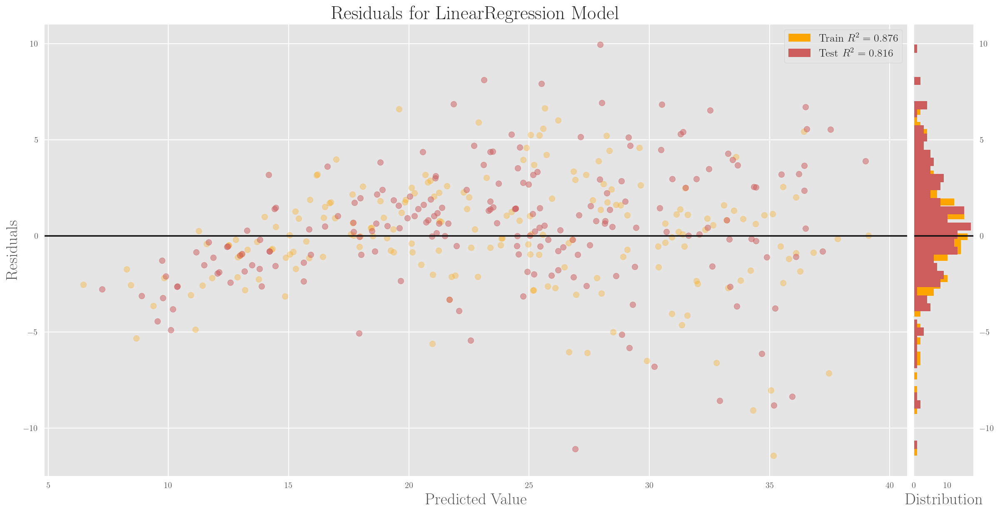

In [45]:
from yellowbrick.regressor import residuals_plot
viz = residuals_plot(model, X_train, y_train, X_test, y_test, 
                     train_color='orange', test_color='IndianRed', train_alpha=0.3, test_alpha=0.5)

Once again, we see a modestly improved coefficient of determination. However, the residuals plot continues to exhibit heteroscedasticity.

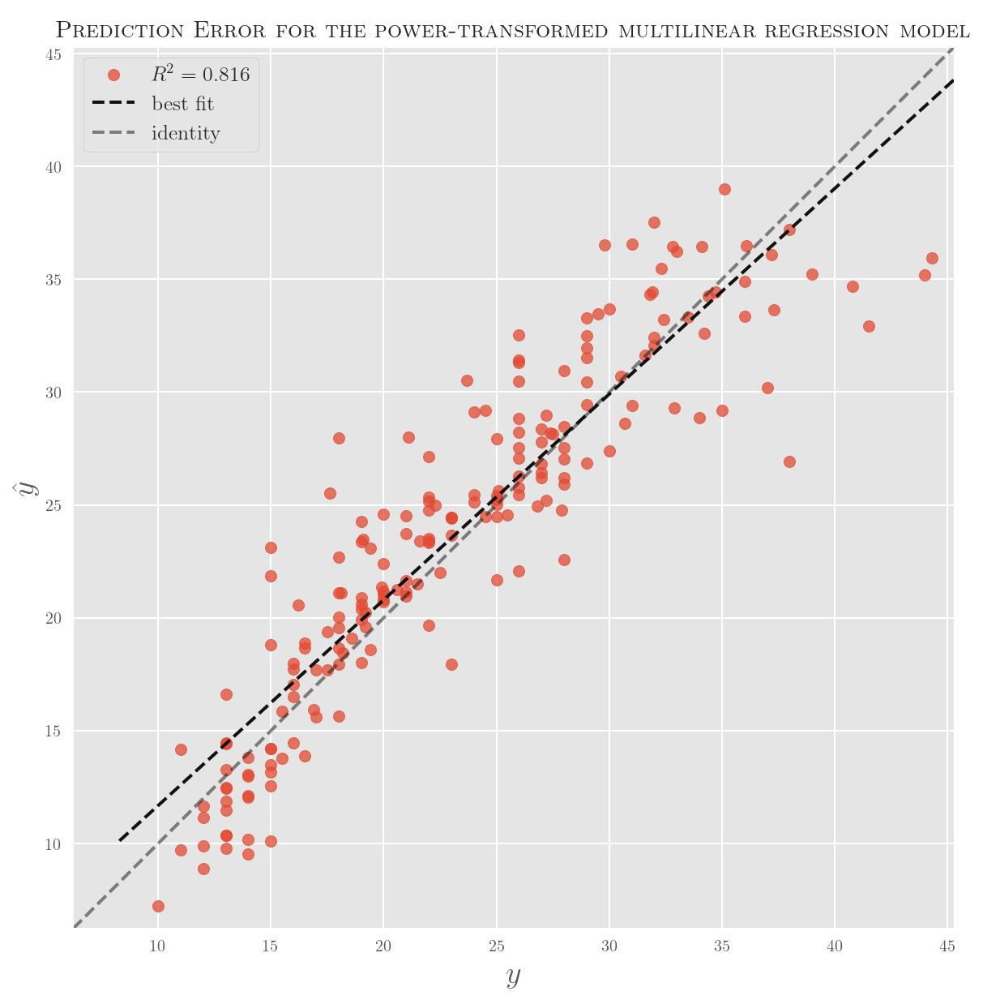

In [46]:
from yellowbrick.regressor import prediction_error

visualizer = prediction_error(model, X_train, y_train, X_test, y_test,
                             title=r'\textsc{\Large Prediction Error for the power-transformed multilinear regression model}',
                             xlabel=r'$\mathbf{y}$', ylabel=r'$\mathbf{\hat{y}}$')

## Model 3: With log transformation

Here we take a different approach. We do know that there is a strong correlation between some of the predictions. Let us therefore drop `cylinders` and `displacement`, since they are strongly correlated to `weight`. This will avoid multicollinearity effects.

Furthermore, let us take a log transformation of `mpg`, `weight` and `horsepower` in view of the observed reciprocal relationship in the scatterplots.

* log(mpg)
* log (weight)
* log (horsepower)


    Let us also drop `displacement` and `cylinders`, since they are highly correlated with `weight`.

In [47]:
data = data.drop(['cylinders', 'displacement'], axis=1)
data.mpg, data.weight, data.horsepower  = np.log(data.mpg), np.log(data.weight), np.log(data.horsepower)

In [48]:
X, y = data.drop('mpg', axis=1), data['mpg']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42,train_size=0.5)
model = make_pipeline(StandardScaler(),  LinearRegression())
model.fit(X_train, y_train)

yhat = model.predict(X_test)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, yhat))
r2 = r2_score(y_test, yhat)
print(rf"Coefficient of Determination (R^2):{r2}")

Mean Squared Error: 0.01
Coefficient of Determination (R^2):0.8681778910123139


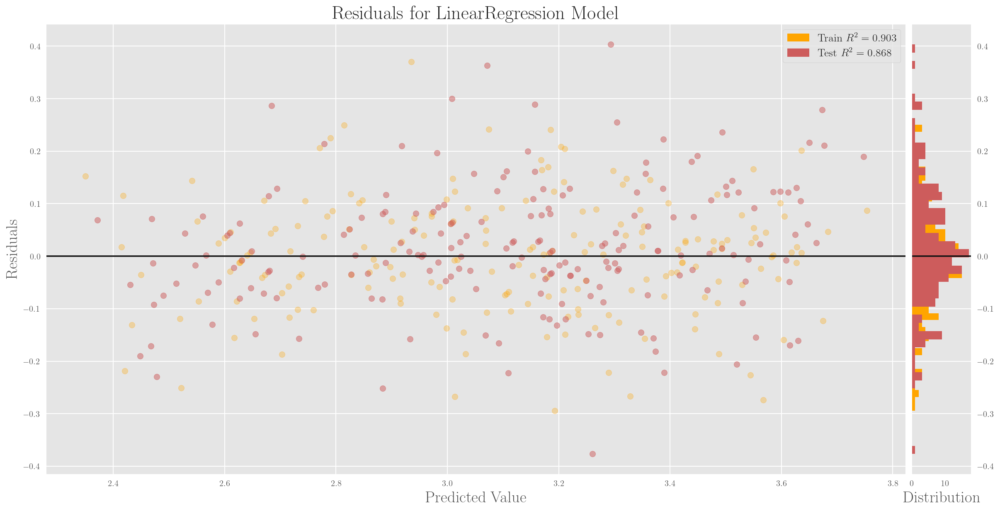

In [49]:
viz = residuals_plot(model, X_train, y_train, X_test, y_test, 
                     train_color='orange', test_color='IndianRed', train_alpha=0.3, test_alpha=0.5)

The residuals plot shows no discernible pattern, and has homoscedasticity; furthermore, the residuals are more or less normally distributed. In addition to this, we observe that the coefficient of determination is the best so far.

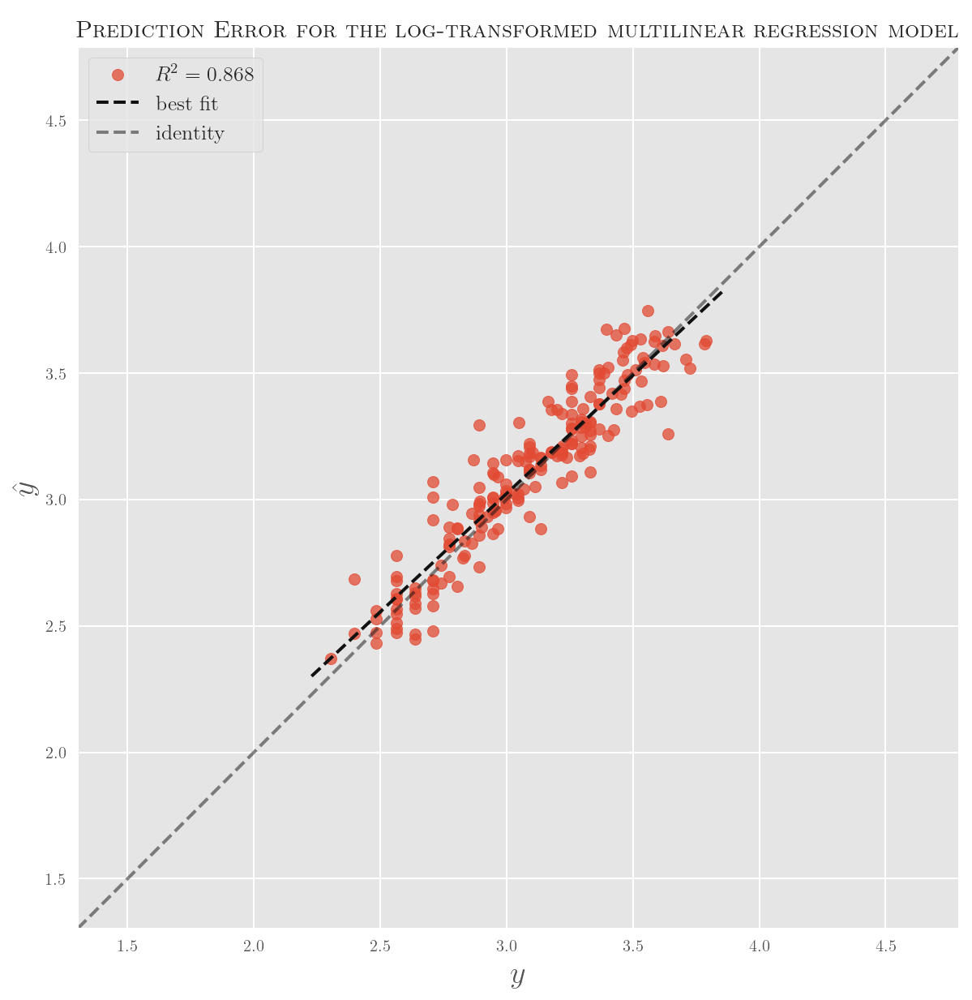

In [50]:
from yellowbrick.regressor import prediction_error

visualizer = prediction_error(model, X_train, y_train, X_test, y_test,
                             title=r'\textsc{\Large Prediction Error for the log-transformed multilinear regression model}',
                             xlabel=r'$\mathbf{y}$', ylabel=r'$\mathbf{\hat{y}}$')

Clearly, this shows a vast improvement over the prior models.

### Cook's Distance to see point of high influence (leverage)

Since linear regression models can be succeptible to points of high influence or leverage, it is worth checking for these.

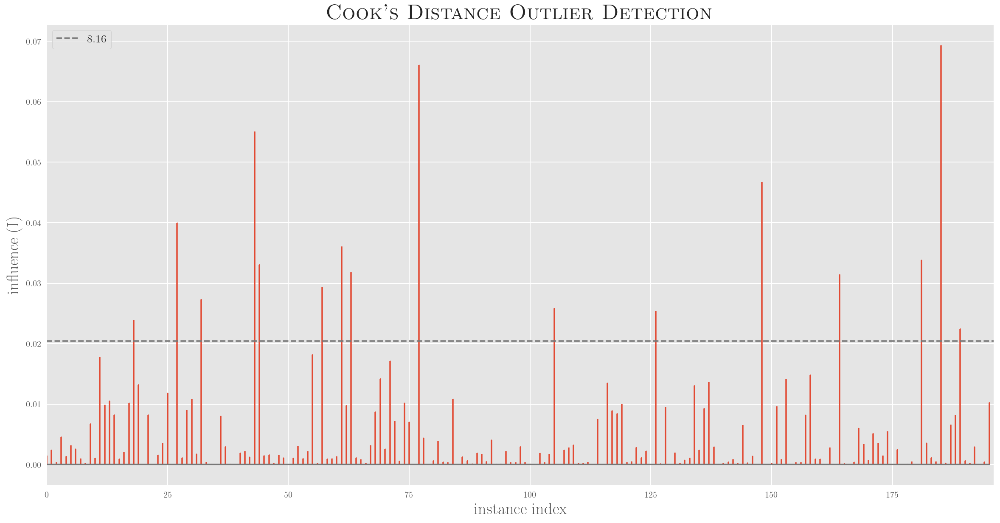

In [51]:
from yellowbrick.regressor import cooks_distance
cooks_distance(
    X_train, y_train,
    draw_threshold=True,
    linefmt="C0-", markerfmt=",",
    title=r"\textsc{\Huge Cook's Distance Outlier Detection}"
    
);

Above, we see that there are a few points with undue influence. On the whole, the linear regression is probably still appropriate, though we may consider if other algorithms that do not suffer from the high-influence points may yield better results.

## Feature Importance

For a linear regression model with standardized data, the magnitude of the coefficients gives a sense of the relative feature importance.

In [52]:
regressor = model.named_steps['linearregression']
print (f'Intercept: {regressor.intercept_}, Slope: {regressor.coef_}')

Intercept: 3.1020781545544436, Slope: [-0.12382729 -0.16197054 -0.02854755  0.10262365 -0.01690457  0.00687424
  0.01397659]


Let us associate these with their corresponding predictors:

In [53]:
X.columns

Index(['horsepower', 'weight', 'acceleration', 'year', 'origin:1', 'origin:2',
       'origin:3'],
      dtype='object')

In [54]:
importances = {}

# normalize coefficients
total = sum([abs(x) for x in regressor.coef_])
print(total)
normed = [abs(x)/total for x in regressor.coef_]
print(normed)

for k, v in zip(X.columns, normed):
    importances[k] = v

relative_imp = {k: v for k, v in sorted(importances.items(), key=lambda item: item[1], reverse=True)}
relative_imp

0.45472443753643016
[0.2723128063897757, 0.35619493227704524, 0.06277989512201763, 0.22568317522736397, 0.03717541828523785, 0.015117369246642776, 0.03073640345191665]


{'weight': 0.35619493227704524,
 'horsepower': 0.2723128063897757,
 'year': 0.22568317522736397,
 'acceleration': 0.06277989512201763,
 'origin:1': 0.03717541828523785,
 'origin:3': 0.03073640345191665,
 'origin:2': 0.015117369246642776}

Let's consider the top three predictors by feature importance. From this, it seems that `weight` has the greatest negative impact on `mpg`. Likewise, `horsepower` too has a significant negative impact. Next, `year` has a positive impact: the more recent a car model is, the more likely it is to have a higher `mpg`. 

Confirm that these relationship agree with the scatter plot of the features, in an earlier section of this notebook.

### Shapley Values

A much more rigorous and general treatment (for all predictive models) of the relative feature importance comes from a game-theoretical treatment owing to the Nobel laureate, Shapley. He asked the question: in a cooperative game, what is the significance of the contribution of each the players in driving an outcome? If we consider an effective prediction model, then each of the predictors is a "player", contributing to the model's effectiveness. One can therefore ask: what is the relative contribution fo each of the players, or predictors? This would be a way to quantify the relative importance of the features.

While one can ask this question globally of a model, the relative feature importance can vary in different regions of the feature space, and so the feature importance analysis has far more intricacies to consider.

The `shap` package will help us in the analysis here:

Mean Squared Error: 0.01
Coefficient of Determination (R^2):0.8681778910123141


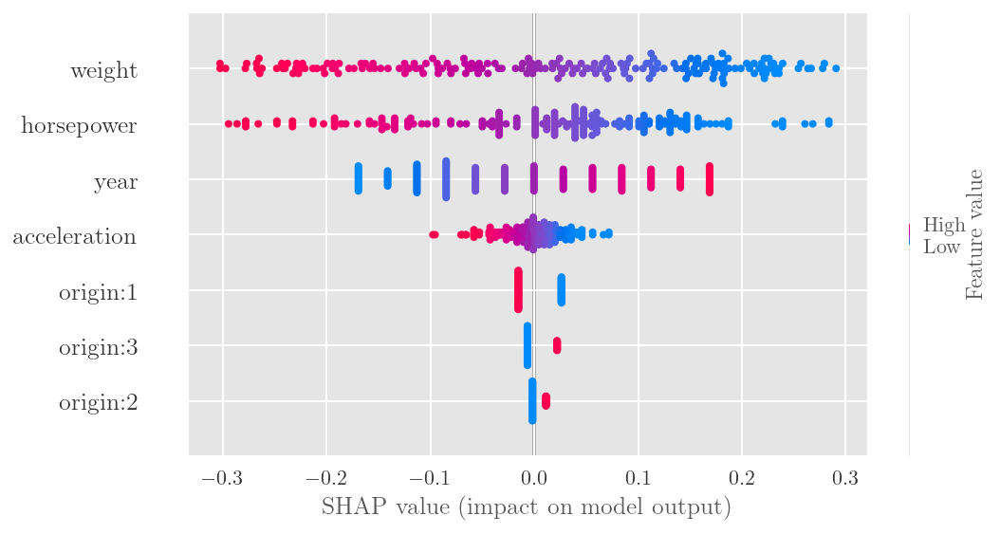

In [55]:
X, y = data.drop('mpg', axis=1), data['mpg']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42,train_size=0.5)
model = LinearRegression()
model.fit(X_train, y_train)

yhat = model.predict(X_test)
print("Mean Squared Error: %.2f"
      % mean_squared_error(y_test, yhat))
r2 = r2_score(y_test, yhat)
print(rf"Coefficient of Determination (R^2):{r2}")


# explain the model's predictions using SHAP
import shap
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

Observe how the `shap` package's conclusions agree with our prior analysis. `shap` has a lot more to contribute, that we will gradually learn about in subsequent notebooks.

## Partial dependence plots

The PDP (partial dependence plots) help us get some intuition on how the value of the target variable responds to the values of each of the predictors, when the other predictors are held fixed.

*Remember, that our features have been standardized and log-transformed.*

Computing partial dependence plots...


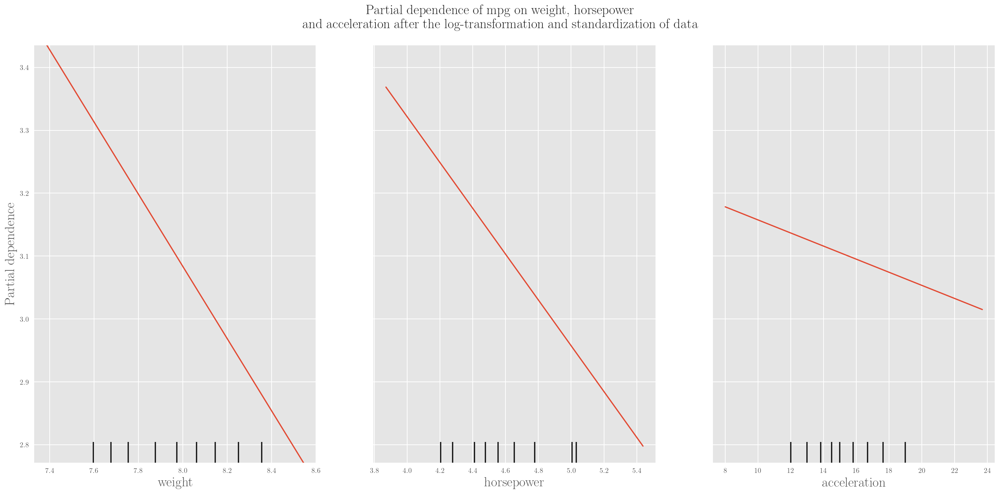

In [56]:
from sklearn.inspection import partial_dependence
from sklearn.inspection import plot_partial_dependence
print('Computing partial dependence plots...')

features = ['weight', 'horsepower', 'acceleration',]
plot_partial_dependence(model, X_train, features,
                        n_jobs=3, grid_resolution=200)

fig = plt.gcf()
fig.suptitle(r'''Partial dependence of mpg on weight, horsepower 
             and acceleration after the log-transformation and standardization of data''')
fig.subplots_adjust(hspace=0.3)
plt.tight_layout()